# Authoritative table of explanatory variables on the Output Area level

This notebook creates an authoritative table of explanatory variables on the output area level. It joins or interpolates data of indicators and explanatory variables to create a single GeoDataFrame that will eventually be used for modelling.

In [1]:
import geopandas as gpd
import tobler
import pandas as pd
import numpy as np
import pooch

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_10962/2464167658.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


Specify a path to the data folder.

In [2]:
data_folder = "/Users/martin/Library/CloudStorage/OneDrive-SharedLibraries-TheAlanTuringInstitute/Daniel Arribas-Bel - demoland_data"

Load 2011 Output Area geoemtry.

In [4]:
oa = gpd.read_file("https://borders.ukdataservice.ac.uk/ukborders/easy_download/prebuilt/shape/infuse_oa_lyr_2011_clipped.zip")

Load a subset of OA centroids for Tyne and Wear.

In [150]:
oa_centroids = gpd.read_file(f"{data_folder}/processed/OA_centroids_TyneWear.gpkg")

Read geometries of the area of interest.

In [5]:
aoi = gpd.read_file(f"{data_folder}/processed/authorities/LADs_TyneWear.shp")

Filter OA geometries falling to Tyne and Wear.

In [157]:
oa_aoi = oa[oa.geo_code.isin(oa_centroids.OA11CD)].reset_index(drop=True)

Visual check.

<AxesSubplot: >

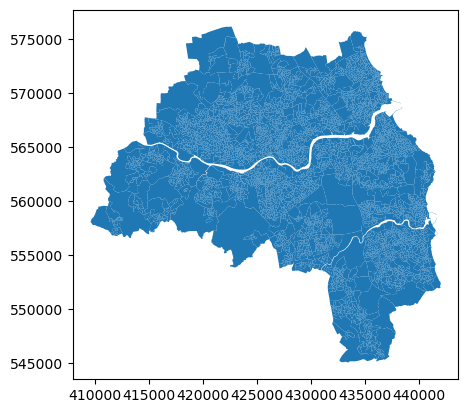

In [155]:
oa_aoi.plot()

Save to file for furhter use.

In [158]:
oa_aoi.to_file(f"{data_folder}/processed/OA_TyneWear.gpkg")

## Air Quality

Air quality index is measured on a grid and needs to be interpolated.

Load the grid.

In [159]:
air = gpd.read_file(f"{data_folder}/processed/air_quality/air_quality_grid_2021.gpkg")

Check the projections.

In [160]:
air.crs == oa_aoi.crs

True

Run areal interpolation.

In [161]:
interp = tobler.area_weighted.area_interpolate(air, oa_aoi, intensive_variables=["aqi"])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: aqi, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")


Visual check.

<AxesSubplot: >

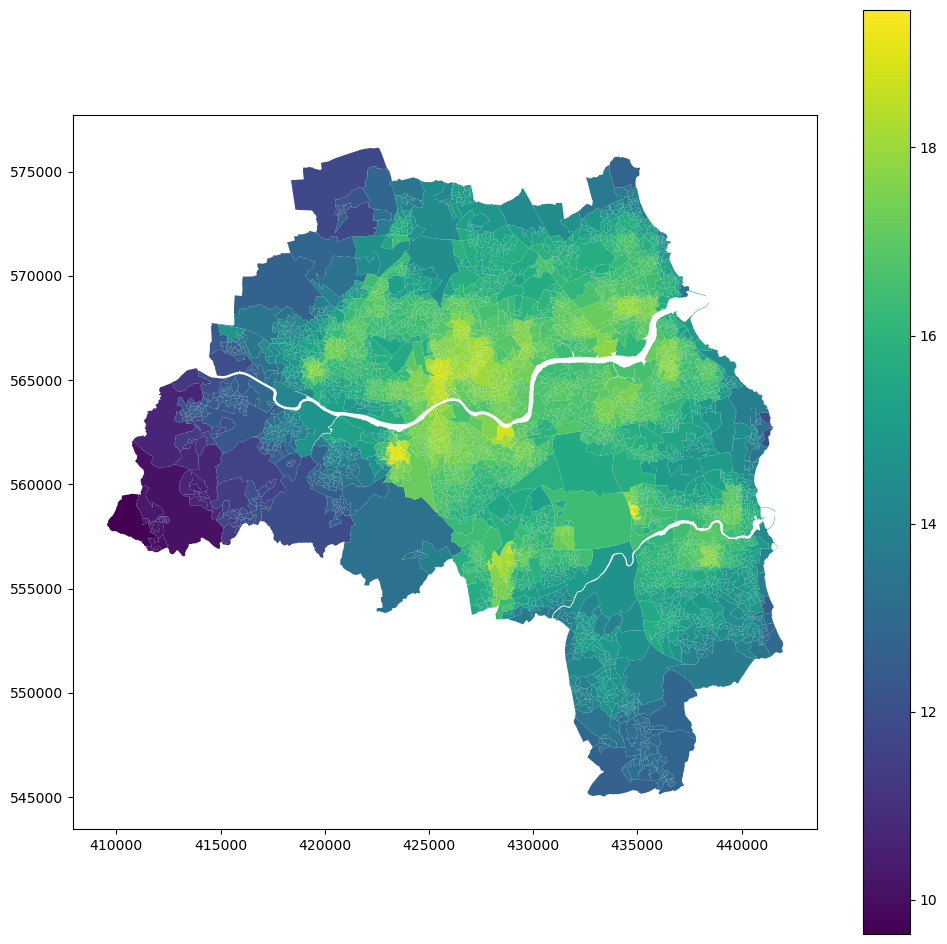

In [162]:
interp.plot('aqi', figsize=(12, 12), legend=True)

Assign the interpolated values to the OA dataframe.

In [163]:
oa_aoi["air_quality_index"] = interp.aqi.values

## House prices

House prices are reported on the OA level and can be merged via attribute.

Load data.

In [164]:
house_price = gpd.read_file(f"{data_folder}/processed/house_prices/price_per_sqm.gpkg")

Merge based on an OA code.

In [165]:
oa_aoi = oa_aoi.merge(house_price[["geo_code", "priceper"]], on="geo_code", how="left")

Visual check.

<AxesSubplot: >

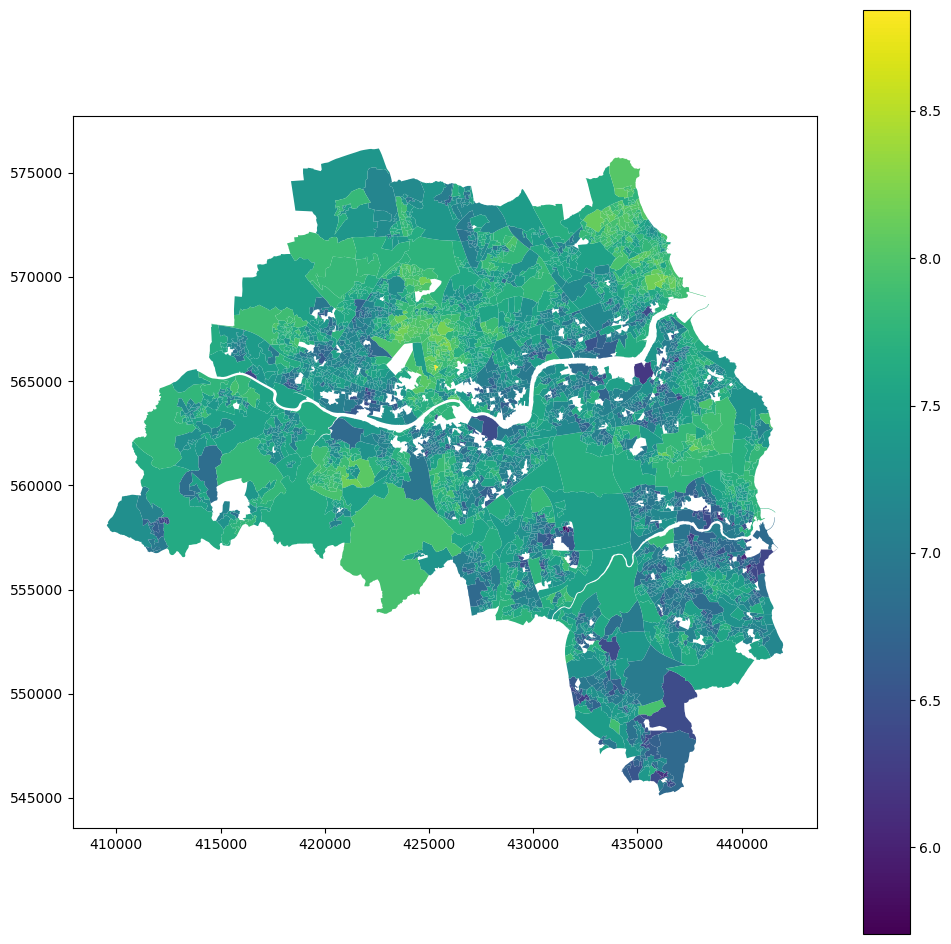

In [166]:
oa_aoi.plot(np.log(oa_aoi["priceper"]), figsize=(12, 12), legend=True)

**Question**: We need to figure out what to do with OAs that do not have any house price data. I would probably drop them before the training of ML. Interpolation may be tricky as we don't know the exact reasons for their missingness (may be mostly parks...). We can also try to load older data there but given the dynamics of house pricing, that may cause more trouble than good.

### Job Accessibility

Job accessibility is measured on the OA level and can be merged.

In [4]:
jobs = pd.read_csv(f"{data_folder}/outputs/results_accessibility/acc_jobs15_OAtoWPZ_tynewear.csv",index_col=0)
jobs.head()

,from_id,A_pop_cum_15
0,E00041363,4318
1,E00041364,7604
2,E00041366,845
3,E00041367,3413
4,E00041368,1728


Merge based on an attribute.

In [5]:
oa_aoi = oa_aoi.merge(jobs, left_on="geo_code", right_on="from_id", how="left")

### Green space accessibility

Green space accessibility is measured on the OA level and can be merged.

In [5]:
gs = pd.read_csv(f"{data_folder}/outputs/results_accessibility/acc_walking_gs15_OAtoGS_tynewear.csv", index_col=0)
gs.head()

,from_id,area_m2
0,E00041363,526165.89095
1,E00041364,527070.65980
2,E00041366,265337.36045
3,E00041367,505729.33200
4,E00041368,325226.25195


Merge based on an attribute.

In [8]:
oa_aoi = oa_aoi.merge(gs, left_on="geo_code", right_on="from_id", how="left")

## Explanatory variables

We also want to have all our explanatory variables linked to the OA geometries.

### Population estimates

ONS population estimates are reported on the OA level and can be merged.

Read the file from ONS.

In [43]:
pop = pd.read_excel(
    pooch.retrieve(url="https://www.ons.gov.uk/file?uri=/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/censusoutputareaestimatesinthenortheastregionofengland/mid2020sape23dt10d/sape23dt10dmid2020coaunformattedsyoaestimatesnortheast.xlsx",
    known_hash=None),
    sheet_name="Mid-2020 Persons",
    skiprows=4
)

Attribute join.

In [167]:
oa_aoi = oa_aoi.merge(pop[["OA11CD", "All Ages"]], left_on="geo_code", right_on="OA11CD", how="left")

Visual check.

<AxesSubplot: >

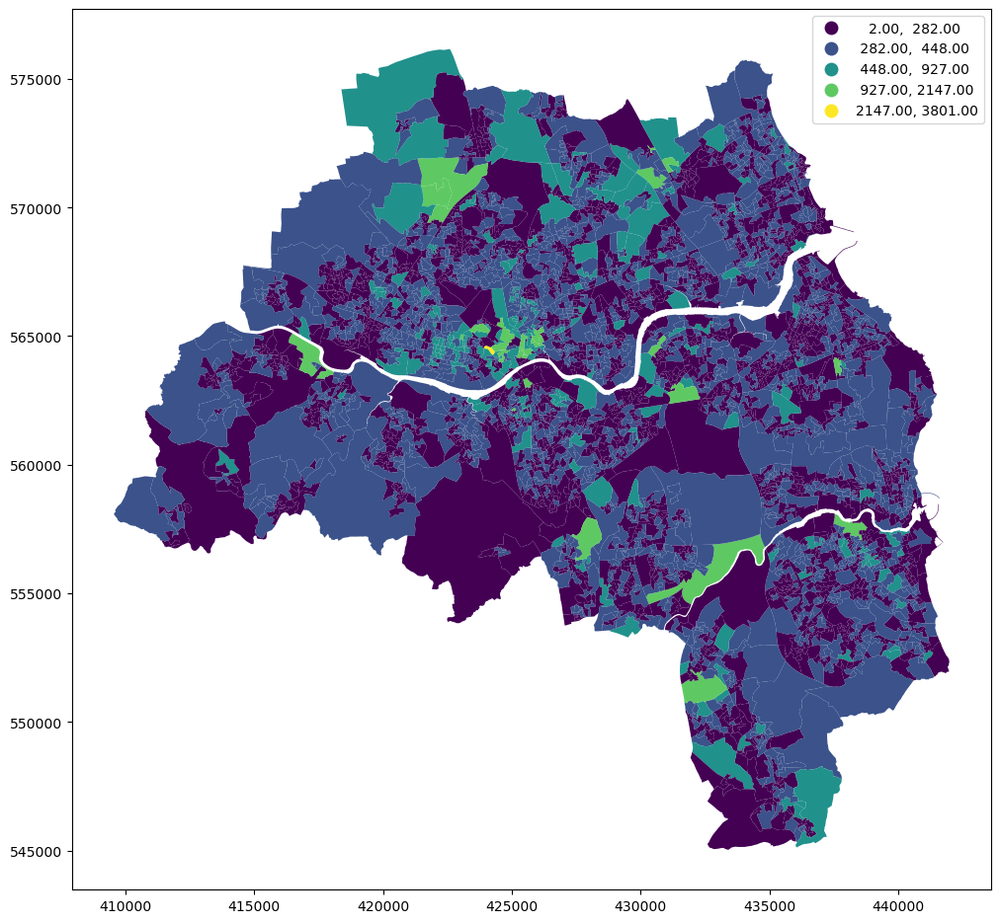

In [168]:
oa_aoi.plot("All Ages", figsize=(12, 12), legend=True, scheme='naturalbreaks')

Check of the distribution.

<AxesSubplot: ylabel='Frequency'>

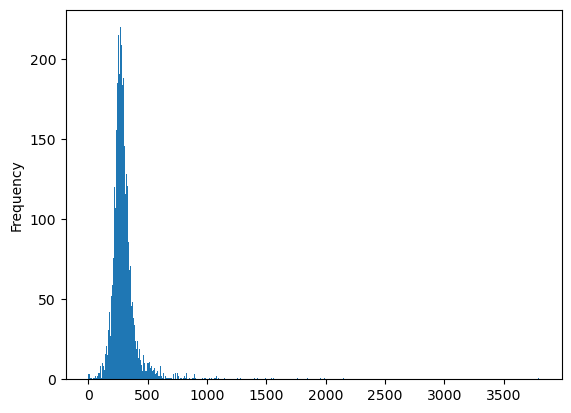

In [169]:
oa_aoi["All Ages"].plot.hist(bins=500)

We will need to manage outliers prior modeling here.


### Workplace population

Workplace population is reported on Workplace Zones and needs to be interpolated to OA. We use the preprocessed data from the Urban Grammar project.

In [170]:
wp = gpd.read_parquet(f"{data_folder}/raw/workplace_population/workplace_by_industry_gb.pq")

We use spatial query to filter only WPZs within the area of interest.

In [171]:
aoi_ix, wp_ix = wp.sindex.query_bulk(aoi.geometry, predicate="intersects")
wp_tyne = wp.iloc[np.unique(wp_ix)]

Visual check.

<AxesSubplot: >

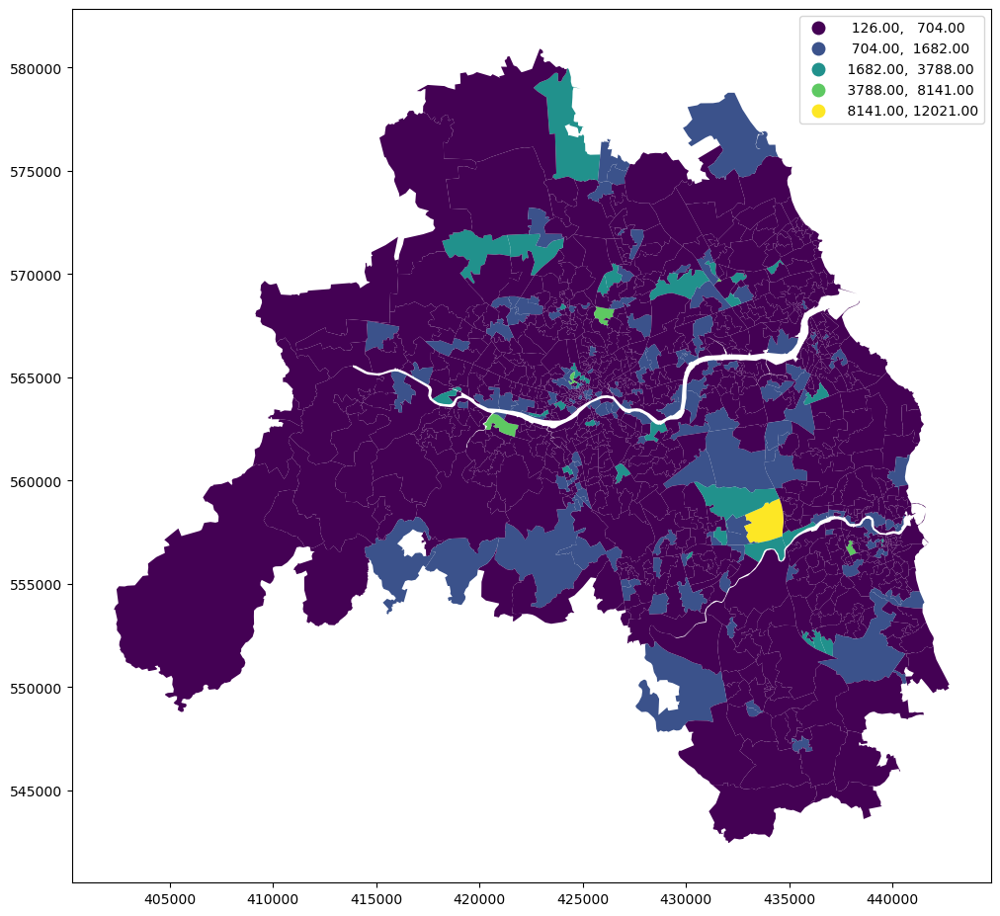

In [173]:
wp_tyne.plot(wp_tyne.sum(axis=1, numeric_only=True), figsize=(12, 12), legend=True, scheme='naturalbreaks')

We interpolate the data from WPZ to OA.

In [174]:
wp_interpolated = tobler.area_weighted.area_interpolate(wp_tyne, oa_aoi, extensive_variables=[
    'A, B, D, E. Agriculture, energy and water',
    'C. Manufacturing', 'F. Construction',
    'G, I. Distribution, hotels and restaurants',
    'H, J. Transport and communication',
    'K, L, M, N. Financial, real estate, professional and administrative activities',
    'O,P,Q. Public administration, education and health',
    'R, S, T, U. Other'
])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


And assign the result to OA dataframe.

In [175]:
oa_aoi[[
    'A, B, D, E. Agriculture, energy and water',
    'C. Manufacturing', 'F. Construction',
    'G, I. Distribution, hotels and restaurants',
    'H, J. Transport and communication',
    'K, L, M, N. Financial, real estate, professional and administrative activities',
    'O,P,Q. Public administration, education and health',
    'R, S, T, U. Other'
]] = wp_interpolated.drop(columns="geometry").values

### Land cover (CORINE)

CORINE is shipped as custom polygons. We use the data downloaded for the Urban Grammar project.

In [90]:
corine = gpd.read_parquet(f"{data_folder}/raw/land_cover/corine_gb.pq")

We filter out only those polygons intersecting the area of interest.

In [176]:
aoi_ix, corine_ix = corine.sindex.query_bulk(aoi.geometry, predicate="intersects")
corine_tyne = corine.iloc[np.unique(corine_ix)]

We interpolate the values to OA as a proportion covered by each type.

In [179]:
corine_interpolated = tobler.area_weighted.area_interpolate(corine_tyne, oa_aoi, categorical_variables=["Code_18"])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


Visual check.

<AxesSubplot: >

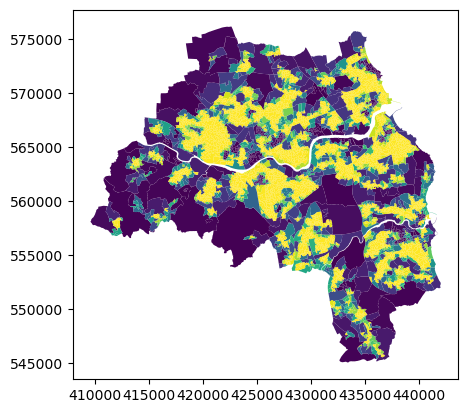

In [180]:
corine_interpolated.plot("Code_18_112")

Assign land cover class names.

In [181]:
corine_names = {
    'Code_18_124': 'Land cover [Airports]',
    'Code_18_211': 'Land cover [Non-irrigated arable land]',
    'Code_18_121': 'Land cover [Industrial or commercial units]',
    'Code_18_421': 'Land cover [Salt marshes]',
    'Code_18_522': 'Land cover [Estuaries]',
    'Code_18_142': 'Land cover [Sport and leisure facilities]',
    'Code_18_141': 'Land cover [Green urban areas]',
    'Code_18_112': 'Land cover [Discontinuous urban fabric]',
    'Code_18_231': 'Land cover [Pastures]',
    'Code_18_311': 'Land cover [Broad-leaved forest]',
    'Code_18_131': 'Land cover [Mineral extraction sites]',
    'Code_18_123': 'Land cover [Port areas]',
    'Code_18_122': 'Land cover [Road and rail networks and associated land]',
    'Code_18_512': 'Land cover [Water bodies]',
    'Code_18_243': 'Land cover [Land principally occupied by agriculture, with significant areas of natural vegetation]',
    'Code_18_313': 'Land cover [Mixed forest]',
    'Code_18_412': 'Land cover [Peat bogs]',
    'Code_18_321': 'Land cover [Natural grasslands]',
    'Code_18_322': 'Land cover [Moors and heathland]',
    'Code_18_324': 'Land cover [Transitional woodland-shrub]',
    'Code_18_111': 'Land cover [Continuous urban fabric]',
    'Code_18_423': 'Land cover [Intertidal flats]',
    'Code_18_523': 'Land cover [Sea and ocean]',
    'Code_18_312': 'Land cover [Coniferous forest]',
    'Code_18_133': 'Land cover [Construction sites]',
    'Code_18_333': 'Land cover [Sparsely vegetated areas]',
    'Code_18_332': 'Land cover [Bare rocks]',
    'Code_18_411': 'Land cover [Inland marshes]',
    'Code_18_132': 'Land cover [Dump sites]',
    'Code_18_222': 'Land cover [Fruit trees and berry plantations]',
    'Code_18_242': 'Land cover [Complex cultivation patterns]',
    'Code_18_331': 'Land cover [Beaches, dunes, sands]',
    'Code_18_511': 'Land cover [Water courses]',
    'Code_18_334': 'Land cover [Burnt areas]',
    'Code_18_244': 'Land cover [Agro-forestry areas]',
    'Code_18_521': 'Land cover [Coastal lagoons]',
}

corine_interpolated.columns = corine_interpolated.columns.map(corine_names)

Assign the subset of classes that may be interesting for our purposes to OA dataframe.

In [183]:
interesting = [
    "Land cover [Discontinuous urban fabric]",
    "Land cover [Continuous urban fabric]",
    "Land cover [Non-irrigated arable land]",
    "Land cover [Industrial or commercial units]",
    "Land cover [Green urban areas]",
    "Land cover [Pastures]",
    "Land cover [Sport and leisure facilities]",
]
oa_aoi[interesting] = corine_interpolated[interesting].values

### Urban morphometrics

Morphometric data is coming directly from the Urban Grammar project.

We need to first identify the chunks covering the AOI.

In [114]:
chunks = gpd.read_parquet(f"{data_folder}/raw/urban_morpho/local_auth_chunks.pq")

Visual exploration.

In [117]:
m = chunks[chunks.intersects(aoi.unary_union)].explore()
aoi.explore(m=m, color="red")

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


We need to work with the chunk 26.

In [118]:
cells =  gpd.read_parquet(f"{data_folder}/raw/urban_morpho/cells_26.pq")

Drop columns we don't need.

In [122]:
chars = cells.columns.drop(["hindex", "tessellation", "buildings", "nodeID", 'edgeID_keys', 'edgeID_values', 'edgeID_primary'])

Interpolate values to OA.

In [184]:
morhp_interpolated = tobler.area_weighted.area_interpolate(cells, oa_aoi, intensive_variables=chars.tolist())

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbAre, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbPer, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbCoA, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: ssbCCo, replacing with 0

Assign to the OA dataframe.

In [185]:
oa_aoi[morhp_interpolated.columns.drop("geometry")] = morhp_interpolated.drop(columns='geometry').values

Clean OA dataframe and rename some columns.

In [187]:
oa_aoi = oa_aoi.drop(columns="OA11CD").rename(columns={"priceper": "house_price_index", "All Ages": "population_estimate", "A_pop_cum_15": "jobs_accessibility_index", "area_m2": "greenspace_accessibility_index"})

Save to Parquet file.

In [11]:
oa_aoi.to_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

In [12]:
oa_aoi.drop(columns="geometry").to_csv(f"{data_folder}/processed/interpolated/all_oa.csv", index=False)

## Maps

We can plot all the values as map for visualisation purposes.

In case we are loading the notebook again and want only plotting, we can load the OA dataframe directly here skipping most of the cells above.

In [3]:
oa_aoi = gpd.read_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

Import plotting libraries.

In [4]:
import contextily 
import palettable.matplotlib as palmpl
import matplotlib.pyplot as plt
import matplotlib.cm
import mapclassify
import husl
import seaborn as sns


from utils import legendgram

#### Air Quality

To get the right extent, we create a box to ensure contextily loads the proper tiles.

In [5]:
from shapely.geometry import box

bds = oa_aoi.total_bounds
extent = gpd.GeoSeries([box((bds[0] - 7000), bds[1], bds[2] + 7000, bds[3])], crs=oa_aoi.crs).to_crs(3857)

Plot the data.

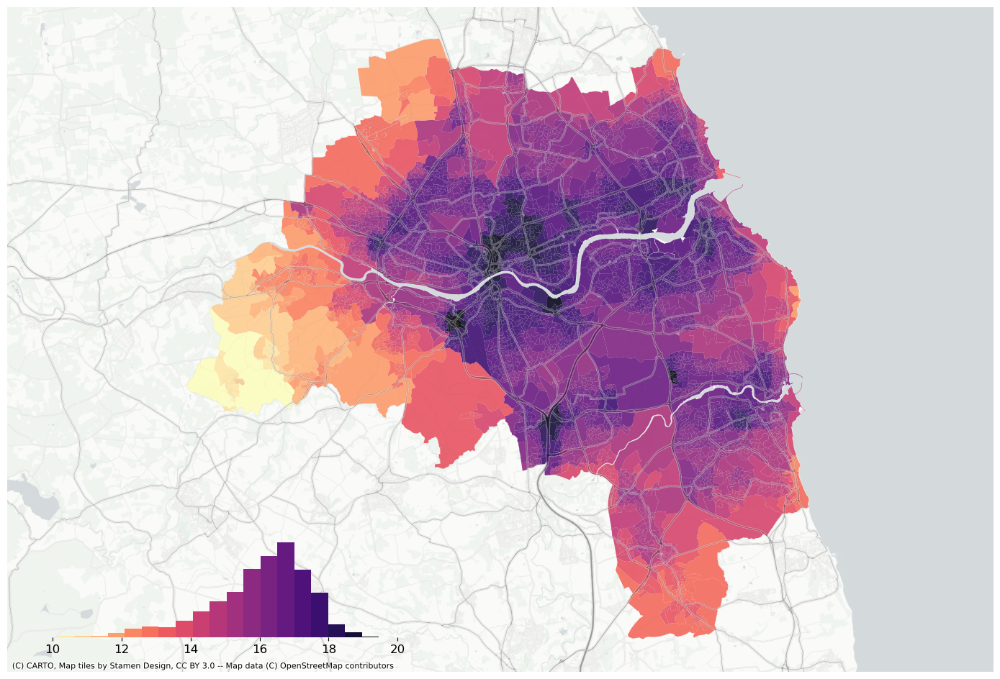

In [8]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot("air_quality_index", scheme="equalinterval", k=20, ax=ax, alpha=.9, cmap="magma_r")
bins = mapclassify.EqualInterval(oa_aoi['air_quality_index'].values, k=20).bins
legendgram(
    f,
    ax,
    oa_aoi['air_quality_index'],
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels.build_url(scale_factor="@2x"), attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")
plt.savefig(f"{data_folder}/outputs/figures/svg/air_quality_index.svg", dpi=144, bbox_inches="tight")


#### House price

Filling NAs just for plotting purposes.

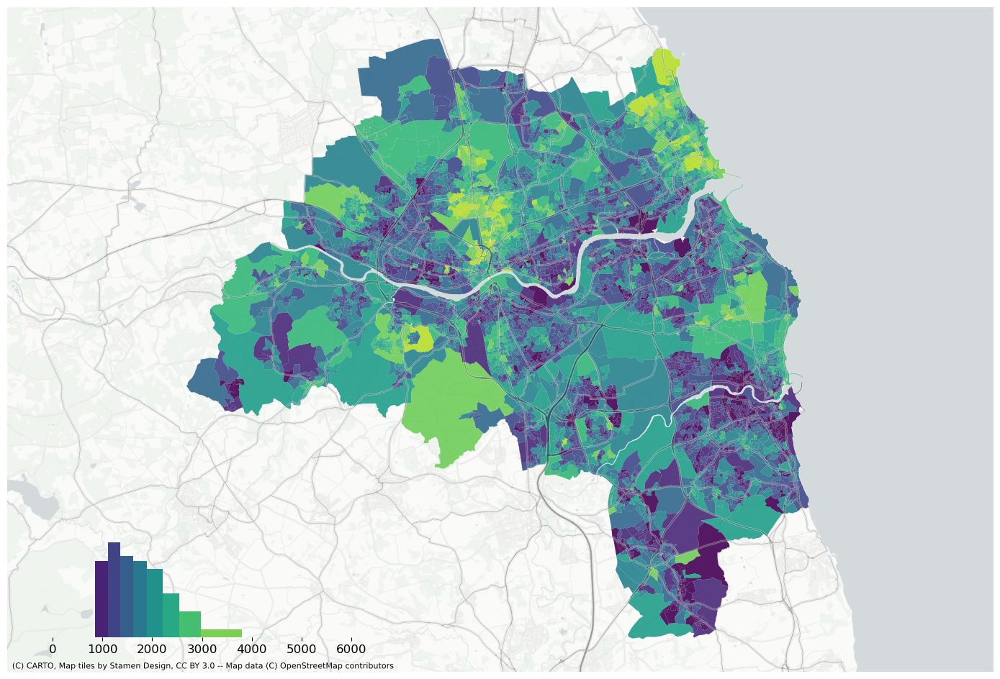

In [10]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(oa_aoi["house_price_index"].fillna(method="pad"), scheme="naturalbreaks", k=10, ax=ax, alpha=.9, cmap="viridis")
bins = mapclassify.NaturalBreaks(oa_aoi["house_price_index"].dropna().values, k=10).bins
legendgram(
    f,
    ax,
    oa_aoi["house_price_index"].dropna(),
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0,oa_aoi["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels.build_url(scale_factor="@2x"), attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/house_price_index.png", dpi=150, bbox_inches="tight")
plt.savefig(f"{data_folder}/outputs/figures/svg/house_price_index.svg", dpi=144, bbox_inches="tight")

#### Jobs accessibility

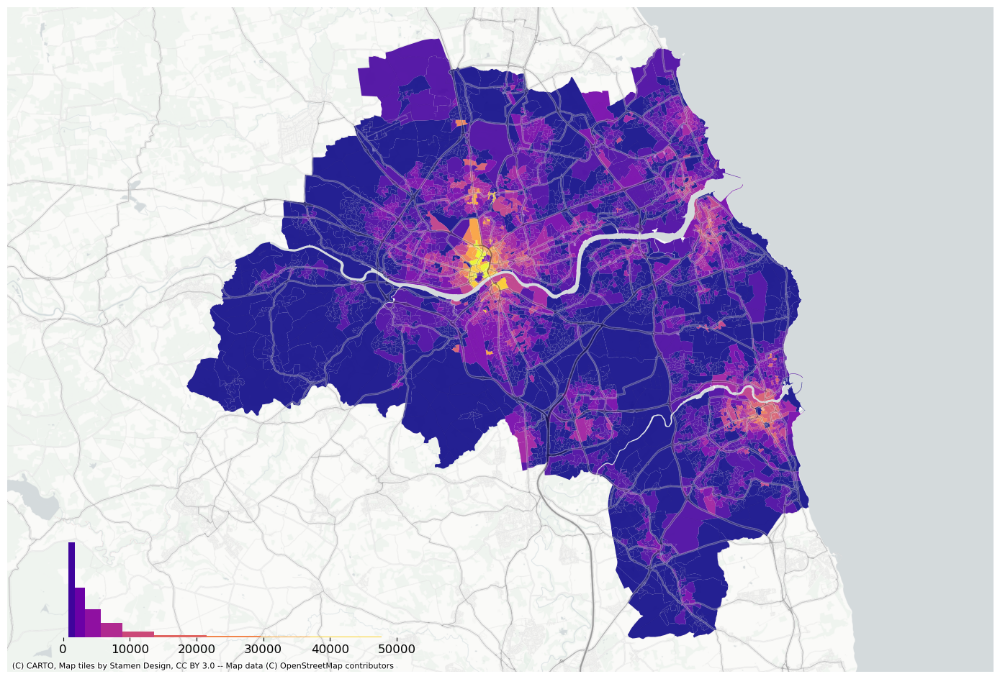

In [11]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(oa_aoi["jobs_accessibility_index"].fillna(method="pad"), scheme="naturalbreaks", k=10, ax=ax, alpha=.9, cmap="plasma")
bins = mapclassify.NaturalBreaks(oa_aoi["jobs_accessibility_index"].dropna().values, k=10).bins
legendgram(
    f,
    ax,
    oa_aoi["jobs_accessibility_index"].dropna(),
    bins,
    pal=palmpl.Plasma_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels.build_url(scale_factor="@2x"), attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/jobs_accessibility_index.png", dpi=150, bbox_inches="tight")
plt.savefig(f"{data_folder}/outputs/figures/svg/jobs_accessibility_index.svg", dpi=144, bbox_inches="tight")

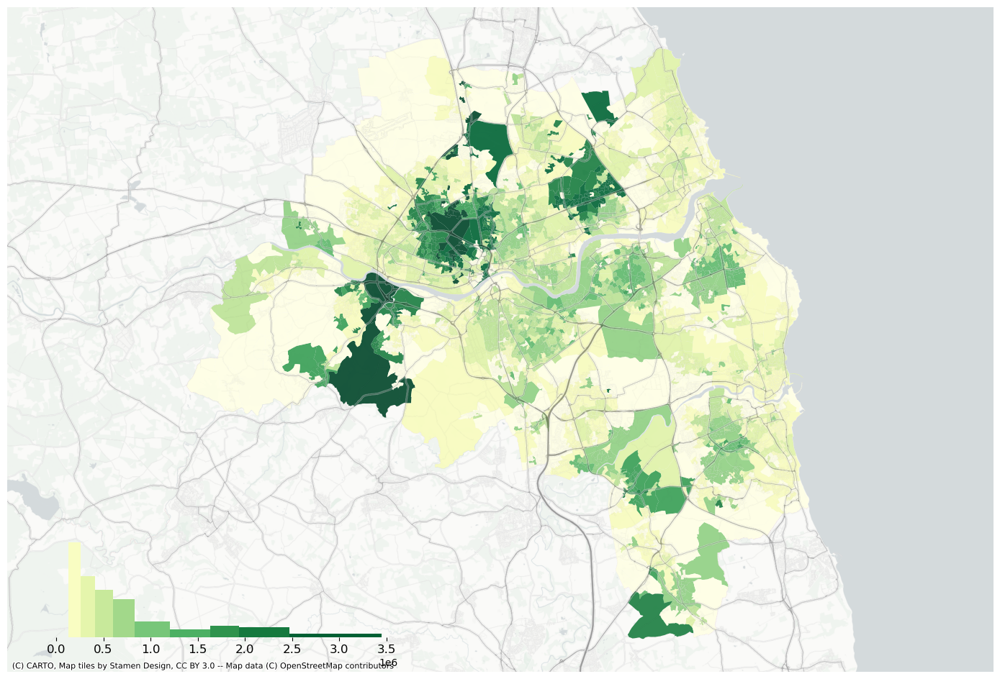

In [12]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(oa_aoi["greenspace_accessibility_index"].fillna(method="pad"), scheme="naturalbreaks", k=10, ax=ax, alpha=.9, cmap="YlGn")
bins = mapclassify.NaturalBreaks(oa_aoi["greenspace_accessibility_index"].dropna().values, k=10).bins
legendgram(
    f,
    ax,
    oa_aoi["greenspace_accessibility_index"].dropna(),
    bins,
    pal=matplotlib.cm.get_cmap('YlGn'),
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels.build_url(scale_factor="@2x"), attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/greenspace_accessibility_index.png", dpi=150, bbox_inches="tight")
plt.savefig(f"{data_folder}/outputs/figures/svg/greenspace_accessibility_index.svg", dpi=144, bbox_inches="tight")

#### Explanatory variables

Some explanatory variables are better to be plotted as densities.

In [13]:
to_density = ['A, B, D, E. Agriculture, energy and water',
       'C. Manufacturing', 'F. Construction',
       'G, I. Distribution, hotels and restaurants',
       'H, J. Transport and communication',
       'K, L, M, N. Financial, real estate, professional and administrative activities',
       'O,P,Q. Public administration, education and health',
       'R, S, T, U. Other', 'population_estimate']

Loop over explanatory variables, assign a random hue, generate a colormap and plot.

In [14]:
for char in oa_aoi.columns.drop(["geometry", "geo_code", "air_quality_index", "house_price_index", "jobs_accessibility_index"]):

    if char in to_density:
        values = oa_aoi[char] / oa_aoi.area
    else:
        values = oa_aoi[char]


    gdf = oa_aoi.to_crs(3857)
    hue = np.random.randint(0, 360, 1)[0]
    k=10  # number of classes
    clip=None  #clip=(0, 100)  # in case of long tail
    mc=mapclassify.NaturalBreaks(values, k=k).bins  # classification scheme
    bins = 50  # resolution of histogram


    # plotting
    color = (hue, 75, 35)
    c = husl.husl_to_hex(*color)
    cmap = sns.light_palette(color, input="husl", as_cmap=True, n_colors=k)

    ax = gdf.plot(values, cmap=cmap, figsize=(18, 12), scheme='UserDefined', k=k, classification_kwds=dict(bins=mc))
    extent.plot(ax=ax, alpha=0)
    ax.set_axis_off()

    # add legend
    hax = legendgram(plt.gcf(), # grab the figure, we need it
            ax, # the axis to add the legend
            values, # the attribute to map
            mc,
            cmap, # the palette to use
            legend_size=(.35,.15),
            loc=4,
         #    tick_params={'color':c, 'labelcolor':c,'labelsize':10},
            clip=clip,
            bins=bins,
            )  # when usign legendgram, dev version from mpl_cmap branch should be used
    contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
    contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
    plt.savefig(f"{data_folder}/outputs/figures/svg/ex_var_{char}.svg", dpi=144, bbox_inches="tight")
    plt.close()

ValueError: Input X contains NaN.
KMeans does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [17]:
signatures

,primary_type
OA11CD,
E00041363,Dense urban neighbourhoods
E00041364,Local urbanity
E00041366,Dense residential neighbourhoods
E00041367,Dense residential neighbourhoods
E00041368,Dense residential neighbourhoods
...,...
E00175601,Dense residential neighbourhoods
E00175602,Dense residential neighbourhoods
E00175603,Dense residential neighbourhoods


In [15]:
signatures = pd.read_parquet("../blackbox/data/oa_key.parquet")

In [23]:
import urbangrammar_graphics as ugg

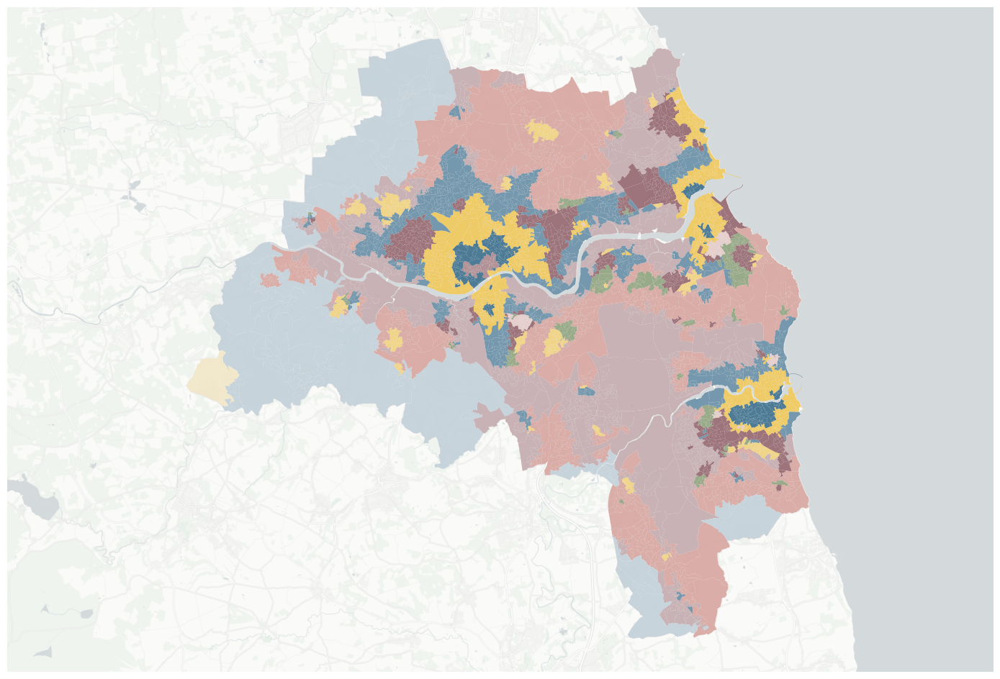

In [38]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(
    color=oa_aoi.merge(signatures, how="left", left_on="geo_code", right_index=True).primary_type.map(ugg.get_signature_colors()),
    ax=ax, alpha=.9,    
    )
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels.build_url(scale_factor="@2x"), attribution="")
# contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/greenspace_accessibility_index.png", dpi=150, bbox_inches="tight")
plt.savefig(f"{data_folder}/outputs/figures/svg/signatures.svg", dpi=144, bbox_inches="tight")